# Task: Geospatial Analysis

In [1]:
import pandas as pd
df = pd.read_csv('Dataset .csv')

In [2]:
# find missing values
missing_values = df.isnull().sum()
print("Missing values in each column:\n", missing_values)

Missing values in each column:
 Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64


In [4]:
import warnings
warnings.filterwarnings('ignore')

#handle missing values
df['Cuisines'].fillna(df['Cuisines'].mode()[0], inplace=True)

missing_values = df.isnull().sum()
print(missing_values)

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                0
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64


In [5]:
# Convert categorical columns to 'category' type
categorical_columns = [ "Restaurant Name", "City", "Address", "Locality", "Locality Verbose","Cuisines", "Currency", "Rating color", "Rating text" ]
df[categorical_columns] = df[categorical_columns].astype('category')

# Convert binary columns to boolean type (assuming "Yes"/"No" values)
binary_columns = ["Has Table booking", "Has Online delivery", "Is delivering now", "Switch to order menu"]
df[binary_columns] = df[binary_columns].map(lambda x: True if x == "Yes" else False)

# Verify the changes
print(df.dtypes)

Restaurant ID              int64
Restaurant Name         category
Country Code               int64
City                    category
Address                 category
Locality                category
Locality Verbose        category
Longitude                float64
Latitude                 float64
Cuisines                category
Average Cost for two       int64
Currency                category
Has Table booking           bool
Has Online delivery         bool
Is delivering now           bool
Switch to order menu        bool
Price range                int64
Aggregate rating         float64
Rating color            category
Rating text             category
Votes                      int64
dtype: object


### 1. Visualizing Restaurant Locations on a Map

In [15]:
import folium
from folium.plugins import MarkerCluster

# Create a base map with a dark theme (CartoDB Dark_Matter)
mean_lat = df['Latitude'].mean()
mean_lon = df['Longitude'].mean()
map_restaurants = folium.Map(location=[mean_lat, mean_lon], zoom_start=10,)

# Add a marker cluster to group nearby locations
marker_cluster = MarkerCluster().add_to(map_restaurants)

# Plot each restaurant as a marker with pop-up information
for _, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=folium.Popup(f"""
            <b>Restaurant Name:</b> {row['Restaurant Name']}<br>
            <b>City:</b> {row['City']}<br>
            <b>Rating:</b> {row['Aggregate rating']}<br>
            <b>Cuisines:</b> {row['Cuisines']}
            """, max_width=300),
        tooltip=row['Restaurant Name']
    ).add_to(marker_cluster)

# Display the map
map_restaurants


### 2. Analyzing the Distribution of Restaurants by City or Country

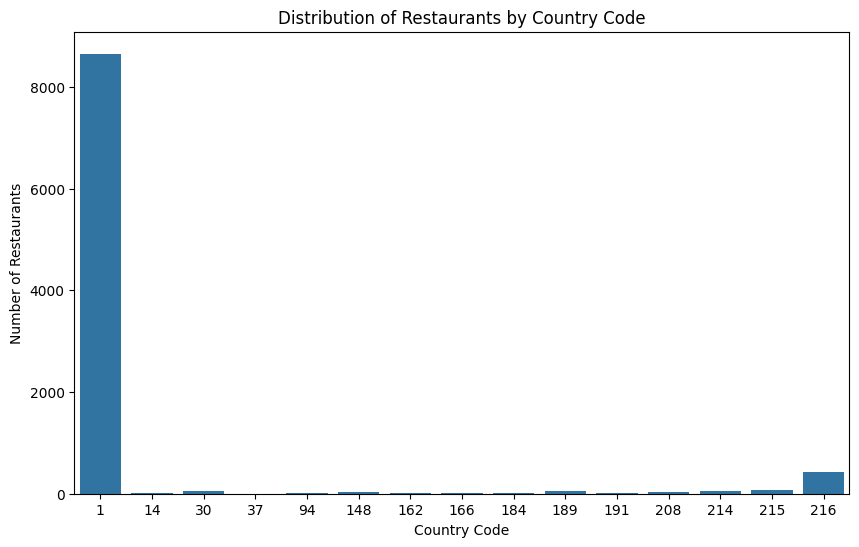

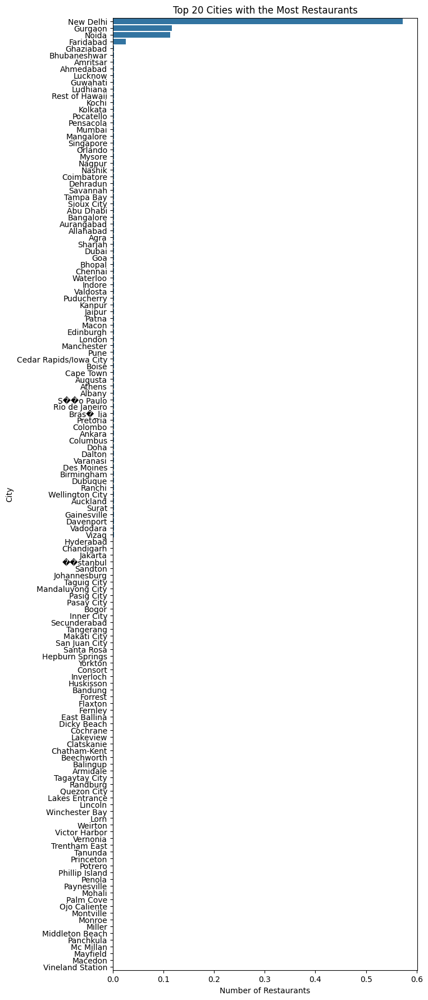

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns

# Distribution by Country Code
country_counts = df['Country Code'].value_counts()
plt.figure(figsize=(10, 6))
sns.barplot(x=country_counts.index, y=country_counts.values)
plt.title('Distribution of Restaurants by Country Code')
plt.xlabel('Country Code')
plt.ylabel('Number of Restaurants')
plt.show()

# Distribution by City
city_counts = df['City'].value_counts(20) # Top 20 cities for readability
plt.figure(figsize=(7,22))
sns.barplot(y=city_counts.index, x=city_counts.values)
plt.title('Top 20 Cities with the Most Restaurants')
plt.xlabel('Number of Restaurants')
plt.ylabel('City')
plt.show()

### 3. Correlation Between Location and Rating

To analyze if there is any correlation between location (city or latitude/longitude) and rating, calculate correlation statistics and create visualizations.

Since latitude/longitude is continuous, you can try a scatter plot with color encoding for rating.

If cities are your focus, calculate the average rating for each city.

In [40]:
pip install plotly

Note: you may need to restart the kernel to use updated packages.


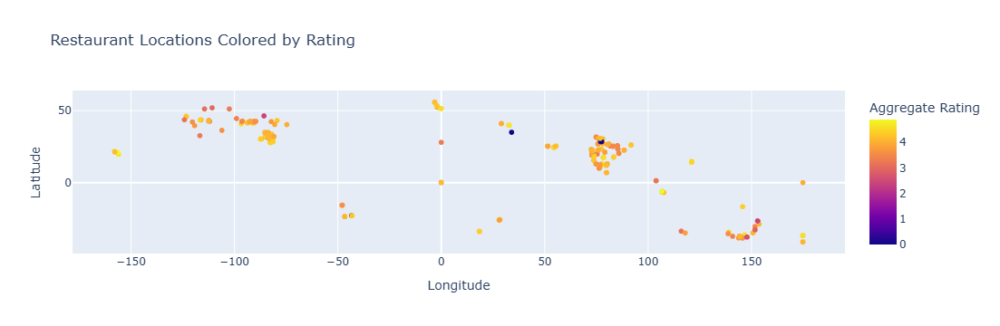

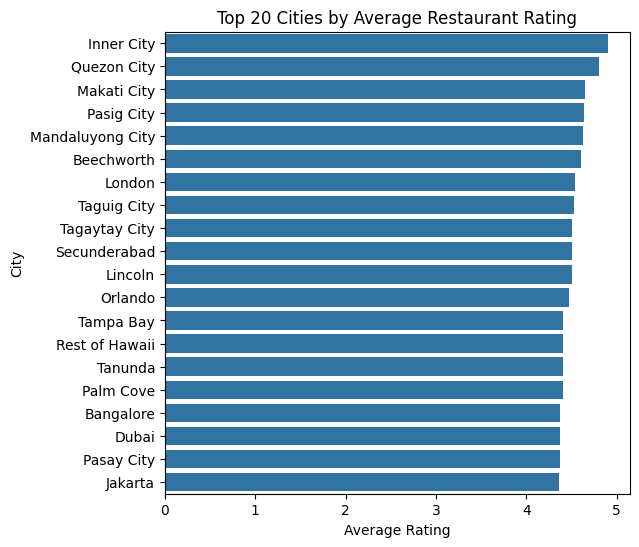

Correlation between Location and Rating:
                   Latitude  Longitude  Aggregate rating
Latitude          1.000000   0.043207          0.000516
Longitude         0.043207   1.000000         -0.116818
Aggregate rating  0.000516  -0.116818          1.000000


In [12]:
# Scatter plot of locations colored by rating
import plotly.express as px
import warnings 
warnings.filterwarnings('ignore')

fig = px.scatter(df, x='Longitude', y='Latitude', color='Aggregate rating',
                 hover_name="Restaurant Name", title="Restaurant Locations Colored by Rating")
fig.update_layout(coloraxis_colorbar=dict(title="Aggregate Rating"))
fig.show()

# Calculate the average rating per city
city_avg_rating = df.groupby('City')['Aggregate rating'].mean().sort_values(ascending=False)
plt.figure(figsize=(6, 6))
sns.barplot(y=city_avg_rating.index[:20], x=city_avg_rating.values[:20])
plt.title('Top 20 Cities by Average Restaurant Rating')
plt.xlabel('Average Rating')
plt.ylabel('City')
plt.show()

# Check correlation between latitude, longitude, and rating
location_correlation = df[['Latitude', 'Longitude', 'Aggregate rating']].corr()
print("Correlation between Location and Rating:\n", location_correlation)